In [20]:
#!unzip '/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip' -d '/content/drive/MyDrive/Dog Vision/'

# End-to-end Multil-class Dog Breed Classification

### Get our workspace ready

In [21]:
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TFHub version:', hub.__version__)

print("GPU", 'yes!!!!!' if tf.config.list_physical_devices("GPU") else 'not ')

TF version: 2.12.0
TFHub version: 0.14.0
GPU yes!!!!!


## Getting our data ready (turning into Tensors)

In [22]:
import pandas as pd
labels_csv= pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

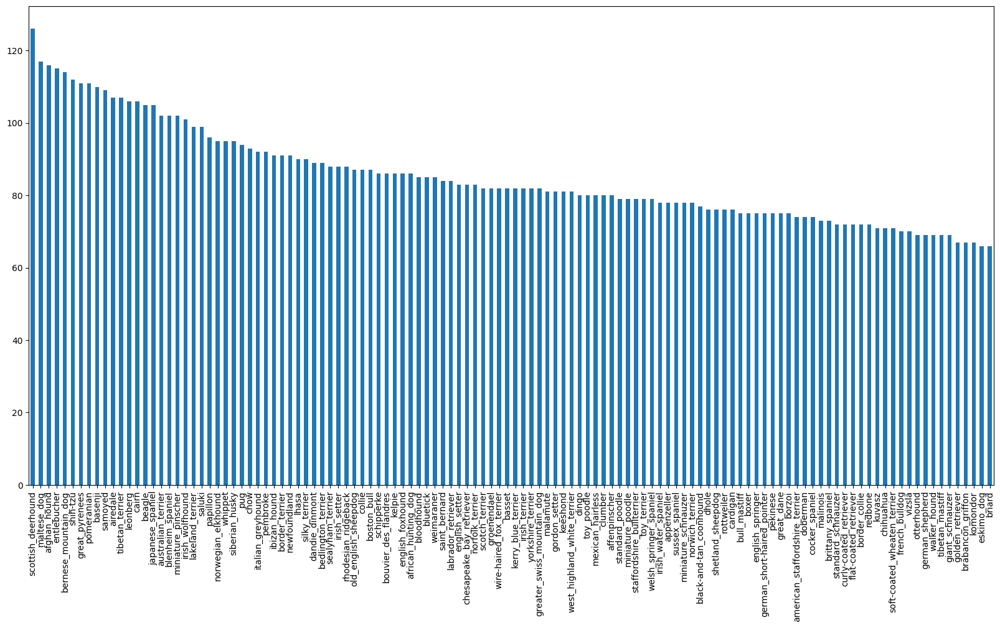

In [23]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [24]:
labels_csv['breed'].value_counts().median()

82.0

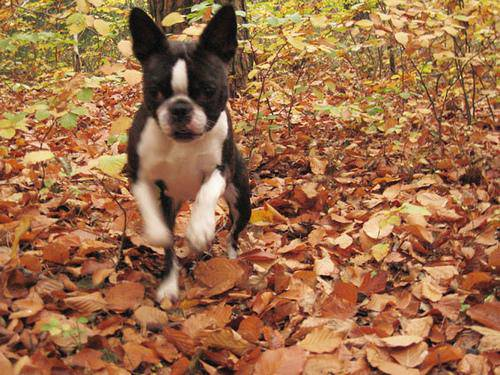

In [25]:
from IPython.display import Image
Image('drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## Getting images and their lables

In [26]:
filenames=['drive/My Drive/Dog Vision/train/'+fname+'.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [27]:
import os
if len(os.listdir('/content/drive/MyDrive/Dog Vision/train'))==len(filenames):
  print('number of files match')
else:
  print('sufficiant data is not present')

number of files match


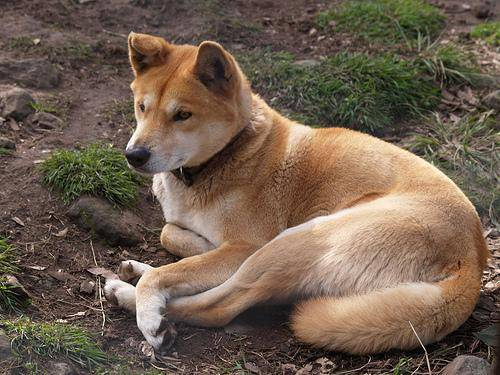

In [28]:
Image(filenames[4000])

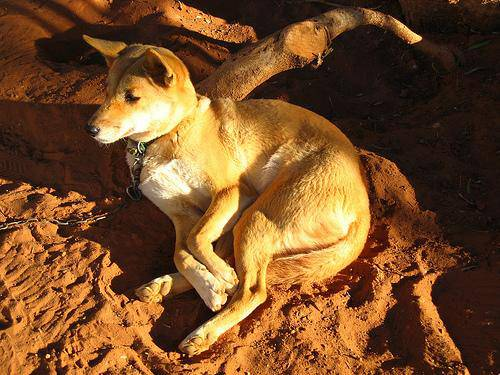

In [29]:
Image('drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [30]:
filenames[9000]

'drive/My Drive/Dog Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

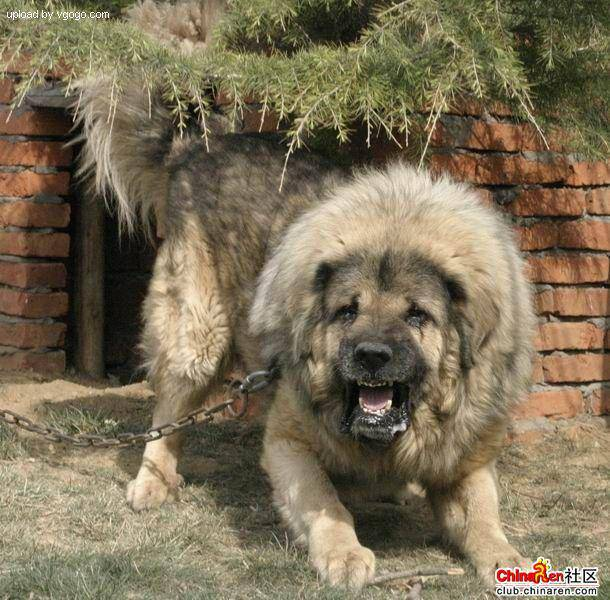

In [31]:
Image('drive/My Drive/Dog Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg')

In [32]:
import numpy as np
labels = labels_csv['breed']
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [33]:
len(labels)

10222

In [34]:
if len(labels)== len(filenames):
  print('Number of  labels matches nuber of file names')
else:
  print('Does not match')

Number of  labels matches nuber of file names


In [35]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [36]:
len(unique_breeds)

120

In [37]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [38]:
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [39]:
len(boolean_labels)

10222

### Creating our own validation set

In [40]:
x=filenames
y=boolean_labels

In [41]:
len(filenames)

10222

We are going to start off experimenting with 1000 images and increase as needed.

In [42]:
NUM_IMAGES =1000 #@param {type:"slider",min:1000, max=10000,steps:1000}

In [43]:
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing Images(turning images into Tensors)

In [44]:
IMG_SIZE =224

def process_image(image_path,img_size=IMG_SIZE):
  image=tf.io.read_file(image_path)

  image = tf.image.decode_jpeg(image,channels=3)

  image=tf.image.convert_image_dtype(image, tf.float32)

  image=tf.image.resize(image,size=[IMG_SIZE, IMG_SIZE])

  return image

## Turing our data into batches

In [45]:
def get_image_label(image_path, label):
  image= process_image(image_path)
  return image, label

In [46]:
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

#### Now convert all into batches

In [47]:
BATCH_SIZE=32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE,valid_data=False, test_data=False):
  if test_data:
    print('Creating data batches...')
    data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))

    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)

  return data_batch

In [48]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

In [49]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulizing Data Batches

In [50]:
import matplotlib.pyplot as plt
def show_25_images(image,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [51]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[2.59595722e-01, 1.90565303e-01, 1.79344252e-01],
          [1.75580546e-01, 1.67578906e-01, 1.77053019e-01],
          [1.59399405e-01, 2.02097431e-01, 2.24948764e-01],
          ...,
          [1.67557955e-01, 2.01906770e-01, 1.90215200e-01],
          [1.79481834e-01, 1.86134428e-01, 1.82808131e-01],
          [1.82808131e-01, 1.82808131e-01, 1.82808131e-01]],
 
         [[1.72587797e-01, 1.92580789e-01, 1.96537375e-01],
          [4.27349806e-01, 5.09652972e-01, 5.44792414e-01],
          [4.90723908e-01, 6.24900997e-01, 6.76839650e-01],
          ...,
          [4.36576873e-01, 4.67866600e-01, 4.73341644e-01],
          [1.84909001e-01, 1.88740194e-01, 1.93878144e-01],
          [1.88235313e-01, 1.88235313e-01, 1.88235313e-01]],
 
         [[1.37499705e-01, 2.10309774e-01, 2.29481488e-01],
          [5.74051261e-01, 7.10430861e-01, 7.61274636e-01],
          [5.99369764e-01, 7.87315309e-01, 8.65797341e-01],
          ...,
          [4.78429288e-01, 5.05250096e-01, 5.2872

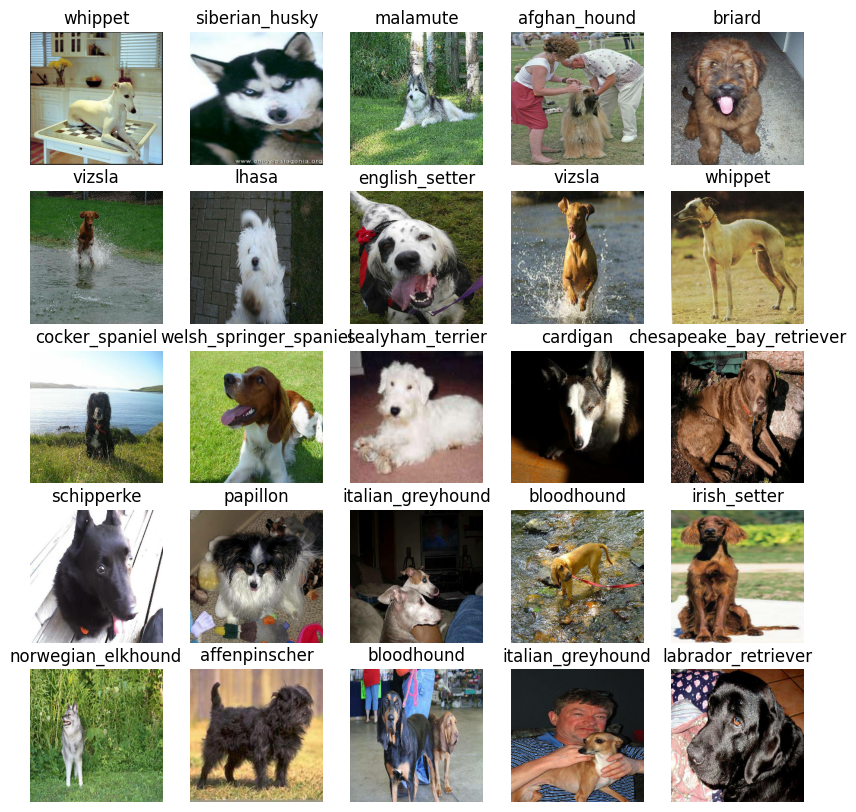

In [52]:
show_25_images(train_images,train_labels)

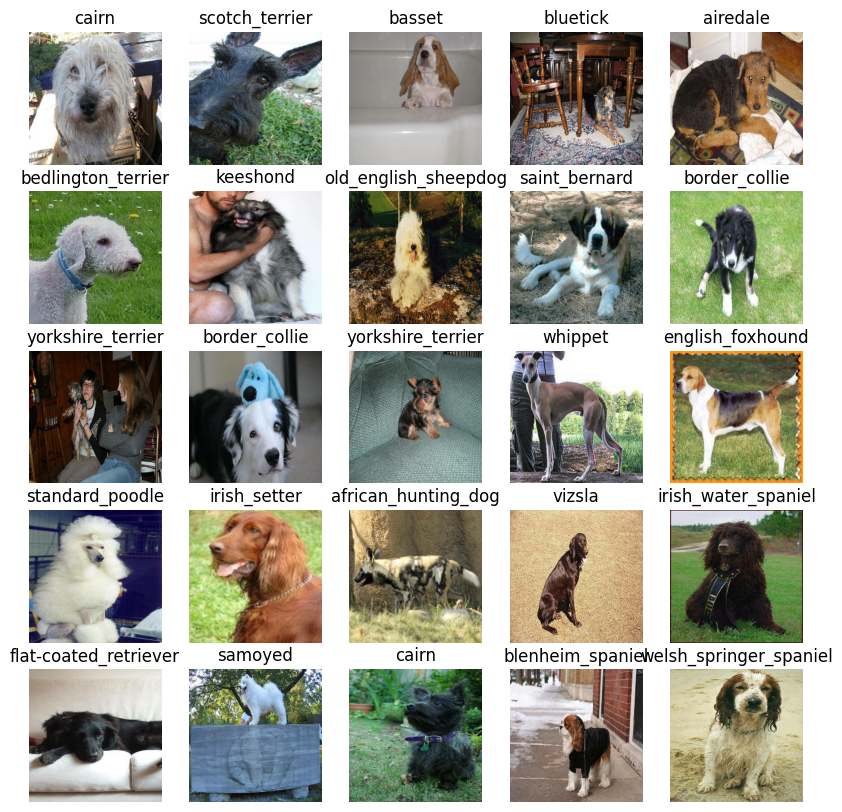

In [53]:
val_images, val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Bulding a model


In [54]:
# Setup input shape to the model
INPUT_SHAPE =[None, IMG_SIZE, IMG_SIZE,3]

#Setup Output shape of our model
OUTPUT_SHAPE= len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now let start with model

In [55]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Bilding model with', MODEL_URL)

  # Setup the model layers
  model= tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax')

  ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  model.build(INPUT_SHAPE)
  return model

In [56]:
model=create_model()
model.summary()

Bilding model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use dauring training to do such things as save in progress, check its progress or stop training early if a model stops improving

In [57]:
%load_ext tensorboard

In [58]:
import datetime

#create a function to build a TensorBoard callback
def create_tensorboard_callback():
  logdir=os.path.join('drive/MyDrive/Dog Vision/logs',
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stoping Callback

In [59]:
early_stopping= tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [60]:
NUM_EPOCHS =100 #@param{type:"slider",min:10,max:100,step:10}

In [61]:
print("GPU", 'available(YESSSS!!!!!)' if tf.config.list_physical_devices('GPU') else 'not avalable:(')

GPU available(YESSSS!!!!!)


In [62]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  model=create_model()

  tensorboard= create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [63]:
model=train_model()

Bilding model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 155s 6s/step - loss: 4.6857 - accuracy: 0.0825 - val_loss: 3.4225 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 4s 178ms/step - loss: 1.6521 - accuracy: 0.6812 - val_loss: 2.2671 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 5s 210ms/step - loss: 0.5749 - accuracy: 0.9275 - val_loss: 1.7892 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 180ms/step - loss: 0.2543 - accuracy: 0.9887 - val_loss: 1.5427 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1477 - accuracy: 0.9975 - val_loss: 1.4525 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 6s 231ms/step - loss: 0.1022 - accuracy: 0.9987 - val_loss: 1.4017 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] -

### Checking the TensorBoard logs
The Tensorboard magic function will access the logs directory we created earlier and visualize its contents.

In [64]:
%tensorboard --logdir drive/MyDrive/Dog Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [65]:
predictions =model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 96ms/step


array([[3.1787044e-04, 8.7438420e-06, 2.5928160e-04, ..., 6.8457230e-05,
        9.8788032e-06, 6.3564661e-03],
       [1.3335677e-03, 4.7284263e-04, 8.0513740e-03, ..., 1.9499228e-03,
        9.4664271e-04, 1.1083634e-04],
       [3.4592933e-05, 1.4638863e-04, 2.7018912e-05, ..., 1.2156031e-05,
        3.3556837e-05, 1.9892644e-04],
       ...,
       [3.3389671e-05, 6.8172990e-06, 9.2086222e-05, ..., 7.3866204e-06,
        1.3397739e-04, 5.4310465e-05],
       [1.0386701e-03, 6.1671912e-05, 2.5903202e-05, ..., 2.9357041e-05,
        5.1283689e-05, 5.5526407e-03],
       [1.8850542e-03, 5.2531097e-05, 8.4968359e-04, ..., 3.0626366e-03,
        3.2958365e-03, 3.6050664e-05]], dtype=float32)

In [66]:
predictions.shape

(200, 120)

In [67]:
# First predictions
index=42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[5.61359739e-05 8.03783259e-05 7.09004889e-05 7.40074611e-05
 9.07137350e-04 3.40705010e-05 1.12810892e-04 1.48363935e-03
 9.60599631e-03 2.17593499e-02 3.79286439e-06 1.03987277e-05
 2.26065560e-04 3.37939244e-03 8.13735183e-04 4.79748845e-03
 2.27077344e-05 1.26715910e-04 1.19796714e-04 1.07150197e-04
 3.10394498e-05 3.88209446e-04 4.42930104e-05 4.39854266e-05
 1.26151619e-02 6.02897017e-05 3.84155501e-05 1.43589437e-04
 2.94391037e-04 1.35572482e-05 1.90628343e-05 4.79692790e-05
 2.10560302e-05 2.32245384e-05 1.49058633e-05 3.76675894e-06
 2.07680732e-05 2.83581117e-04 5.10905520e-05 1.85689434e-01
 2.08839934e-04 1.06440675e-05 5.64840669e-03 3.23896847e-06
 1.56466092e-04 1.52306175e-05 5.70014454e-05 1.04654755e-03
 1.00324360e-05 1.50082022e-04 1.28033411e-04 1.12917347e-04
 3.17145110e-04 1.86929863e-03 3.28449969e-05 2.66431831e-04
 5.82702778e-05 4.49725958e-05 1.35486262e-05 6.89220087e-06
 9.81099947e-05 3.06846166e-04 4.28148951e-06 3.34959695e-05
 1.24391881e-04 7.198521

In [68]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

We have to unbatchify val_data

In [69]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [70]:
def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [71]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image= prediction_probabilities[n], labels[n], images[n]

  pred_label=get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color='green'
  else:
     color='red'

  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

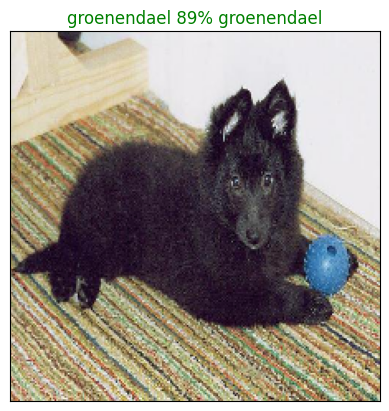

In [72]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [73]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label=get_pred_label(pred_prob)

  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels== true_label)].set_color('green')
  else:
    pass


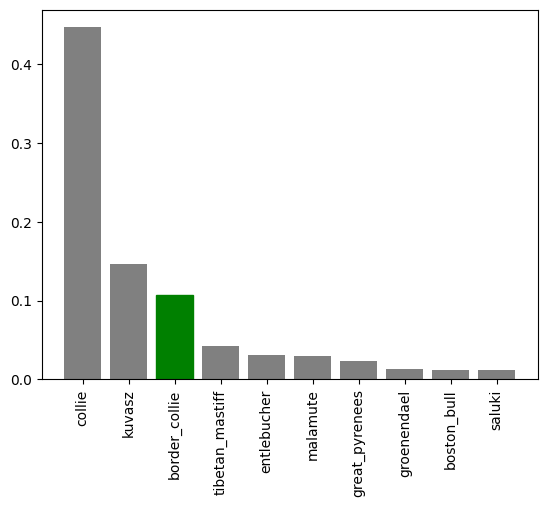

In [74]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

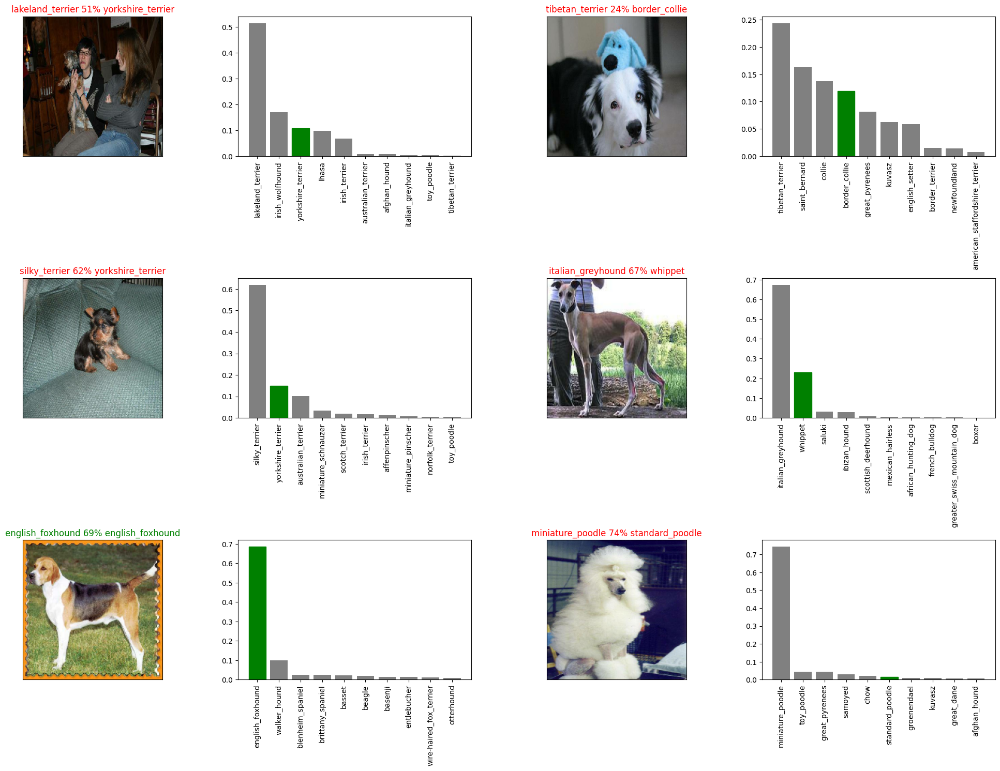

In [75]:
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,
            val_labels,
            val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving a model

In [76]:
def save_model(model, suffix=None):
  modeldir= os.path.join('drive/MyDrive/Dog Vision/models',
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix +".h5"
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [77]:
def load_model(model_path):
  print(f'Loading saved model from: {model_path}...')
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [78]:
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog Vision/models/20230731-14371690814278-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230731-14371690814278-1000-images-mobilenetv2-Adam.h5'

In [80]:
loaded_1000_image_model=load_model('drive/MyDrive/Dog Vision/models/20230731-14371690814278-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20230731-14371690814278-1000-images-mobilenetv2-Adam.h5...


# Training a big dog model (on the full data)

In [81]:
full_data= create_data_batches(x,y)

In [82]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [83]:
full_model=create_model()

Bilding model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [84]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                           patience=3)

In [85]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 142ms/step - loss: 1.3475 - accuracy: 0.6667
Epoch 2/100
320/320 [==============================] - 43s 134ms/step - loss: 0.3994 - accuracy: 0.8809
Epoch 3/100
320/320 [==============================] - 57s 179ms/step - loss: 0.2335 - accuracy: 0.9375
Epoch 4/100
320/320 [==============================] - 49s 154ms/step - loss: 0.1527 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 48s 150ms/step - loss: 0.1087 - accuracy: 0.9774
Epoch 6/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0787 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0601 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 37s 114ms/step - loss: 0.0463 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0372 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 37s 116m

In [86]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog Vision/models/20230731-14551690815335-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230731-14551690815335-full-image-set-mobilenetv2-Adam.h5'

In [88]:
loaded_full_model=load_model('drive/MyDrive/Dog Vision/models/20230731-14551690815335-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20230731-14551690815335-full-image-set-mobilenetv2-Adam.h5...


# Making predictions on the test dataset

In [100]:
test_path='drive/MyDrive/Dog Vision/test/'
test_filename=[test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['drive/MyDrive/Dog Vision/test/e4b76574d24800b91bdcfc886fb74f23.jpg',
 'drive/MyDrive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/Dog Vision/test/deec3d206b0f5c927c86ed1782990961.jpg',
 'drive/MyDrive/Dog Vision/test/dce09c7574fbbe57f39606daf32e5445.jpg',
 'drive/MyDrive/Dog Vision/test/e4369279919beecfb6d91a5375bc122f.jpg',
 'drive/MyDrive/Dog Vision/test/e5b14b20ee8ac070bf5cea3b640f3dde.jpg',
 'drive/MyDrive/Dog Vision/test/e1bc331d2667664376a50f7ff627ec5d.jpg',
 'drive/MyDrive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 'drive/MyDrive/Dog Vision/test/e0e3eb01e80b1d694a47b23909e158ec.jpg',
 'drive/MyDrive/Dog Vision/test/e119301e11d4f1620948c3e6f5a3f021.jpg']

In [101]:
test_data=create_data_batches(test_filename, test_data=True)

Creating data batches...


In [102]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [104]:
test_predictions =loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 34s 105ms/step


In [105]:
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [106]:
test_ids= [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id']=test_ids

In [107]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4b76574d24800b91bdcfc886fb74f23,6.080358e-05,2.641627e-05,1.048695e-10,5.508450e-10,2.493906e-11,7.537422e-06,5.165933e-10,2.167852e-10,1.797189e-09,...,4.632473e-05,2.733767e-09,4.081556e-11,8.211101e-11,9.097671e-11,8.937793e-13,1.193771e-11,1.188725e-14,1.460892e-13,8.782589e-10
1,e7afcce6e45858fc3b294cc5c0b15a53,1.010851e-01,1.424067e-08,4.437501e-10,5.142152e-11,4.889842e-10,5.640453e-12,6.500522e-08,3.132404e-12,1.927309e-12,...,1.710523e-08,1.844116e-09,1.725113e-09,3.320284e-10,6.651863e-11,2.439262e-13,4.758877e-12,3.540110e-11,6.078296e-09,4.084220e-07
2,deec3d206b0f5c927c86ed1782990961,3.654528e-12,3.323673e-12,4.228965e-12,6.417552e-09,1.166735e-08,6.436643e-08,2.632781e-11,5.661730e-13,2.781326e-12,...,2.857566e-12,1.808368e-11,2.594304e-10,1.112660e-09,1.436028e-12,3.183102e-11,1.103832e-11,1.559889e-11,1.259891e-12,8.467300e-11
3,dce09c7574fbbe57f39606daf32e5445,8.971532e-10,1.260423e-11,1.000578e-11,2.031231e-10,1.288015e-10,1.892551e-13,9.538886e-12,1.058268e-14,6.786831e-11,...,9.100416e-09,1.787218e-11,9.980393e-09,7.514744e-11,4.678481e-10,3.663218e-11,1.059752e-11,2.272895e-12,3.333018e-12,9.574852e-08
4,e4369279919beecfb6d91a5375bc122f,2.613487e-05,1.247674e-08,1.997927e-08,1.327197e-12,1.349157e-05,1.264646e-09,5.614874e-06,1.250659e-06,2.273476e-08,...,3.347638e-02,5.139049e-05,1.478906e-07,2.202387e-07,1.993729e-07,2.782615e-09,3.573975e-01,2.104771e-09,6.273452e-06,3.983883e-05


In [108]:
preds_df.to_csv('drive/MyDrive/Dog Vision/full_model_prediction_submission_1_mobilenetV2.csv',
                index=False)